<a href="https://colab.research.google.com/github/MinahilRaza/Tennis-Ball-Tracking/blob/main/ParticleFilterforTennisBallTracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook, we apply the particle filter to track the tennis ball in the match videos

In [2]:
import numpy as np
import cv2
import copy

# clase que implementa el Filtro de Particulas
class ParticleFilter(object):
    def __init__(self):
        # datos de una particula
        # INI_MODIFICABLE
        self.x = 0
        self.y = 0
        # FIN_MODIFICABLE

        # atributos necesarios para llevar a cabo el filtro de particulas
        self.weight = 0
        self.initWeight = 0
        self.acumWeight = 0

    def simulateParticle(self):
        # Aplica ruido gaussiano
        # INI_MODIFICABLE 
        self.x += np.random.normal(-5,5)
        self.y += np.random.normal(-5,5)
        # FIN_MODIFICABLE

    def esError(self, image, x, y):
        height, width, layers = image.shape
        if (x < 0) or (x >= width) or (y < 0) or (y >= height):
            return True

        pixel = image[y, x]
        if pixel[0] < 128 or pixel[1] < 128 or pixel[2] < 128:
            return True

        return False

    def measureParticle(self, image):
        # medimos el error y le asignamos un peso
        error = 0
        total = 20*20#11*11
        for x in range (int(self.x -10), int(self.x+10)):
            for y in range (int(self.y -10), int(self.y+10)):
                if self.esError(image, x, y):
                    error += 1

        # INI_MODIFICABLE
        self.weight = (1 - error/total)*0.99 + 0.01
        # FIN_MODIFICABLE




    # NO MODIFICAR NADA
    # atributos para llevar a cabo el filtro de particulas
    particles = []
    bestParticle = None
    totalWeight = 0

    # crea las particulas
    @staticmethod
    def create(num):
        for x in range(num):
            ParticleFilter.particles.append(ParticleFilter())

    # simula todas las particulas
    @staticmethod
    def simulate():
        for p in ParticleFilter.particles:
            p.simulateParticle()

    # realiza la medicion de cada particula, calculando el peso inicial y final de cada particula
    # la mejor particula
    @staticmethod
    def measure(image):
        ParticleFilter.bestWeight = 0
        ParticleFilter.bestParticle = None
        ParticleFilter.totalWeight = 0
        for p in ParticleFilter.particles:
            p.initWeight = ParticleFilter.totalWeight
            p.measureParticle(image)
            w = p.weight
            if w > ParticleFilter.bestWeight:
                ParticleFilter.bestWeight = w
                ParticleFilter.bestParticle = p
            ParticleFilter.totalWeight += w
            p.acumWeight = ParticleFilter.totalWeight

    # remuestrea las particulas teniendo en cuenta el peso de cada una
    @staticmethod
    def resample():
        # se generan los numeros aleatorios
        weights = np.random.uniform(0, ParticleFilter.totalWeight, len(ParticleFilter.particles))
        new_particles = []
        for w in weights:
            # se obtiene la particula y se introduce una copia
            p = ParticleFilter.getParticleByWeight(w)
            new_particles.append(copy.copy(p))

        ParticleFilter.particles = new_particles

    # devuelve la particula que tiene asignado el intervalo que contiene a w
    @staticmethod
    def getParticleByWeight(w):
        inf = 0
        sup = len(ParticleFilter.particles)
        while (inf <= sup):
            centro = (inf+sup)//2
            p = ParticleFilter.particles[centro]
            if (w < p.initWeight):
                sup = centro - 1
            elif w > p.acumWeight:
                inf = centro + 1
            else:
                return p

        return None

    # dibuja una particula como un cuadrado de color
    def draw(self, image, color):
        cv2.rectangle(image, (int(self.x-5), int(self.y-5)), (int(self.x+5), int(self.y+5)), color, 1)

Frame: 9


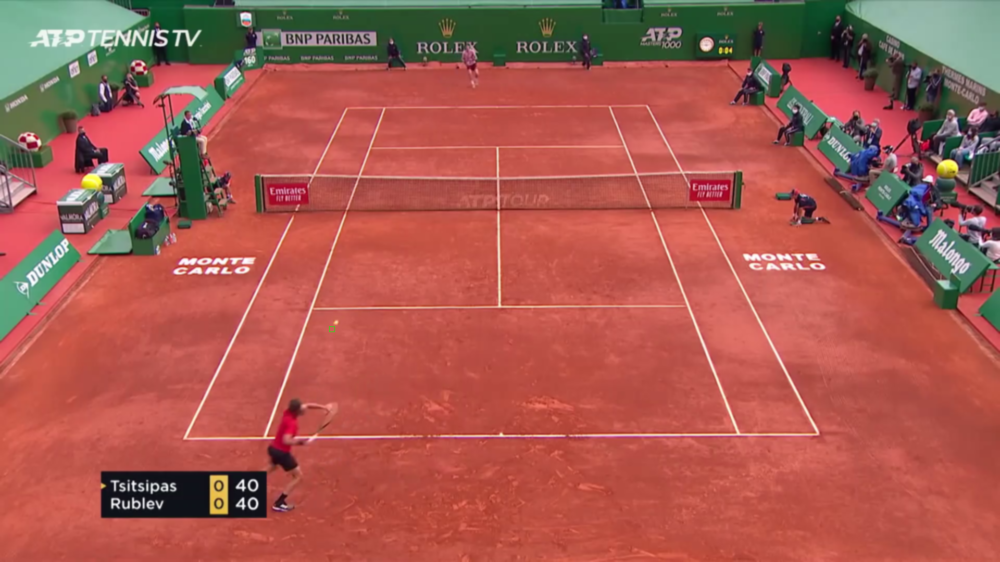

Frame: 10


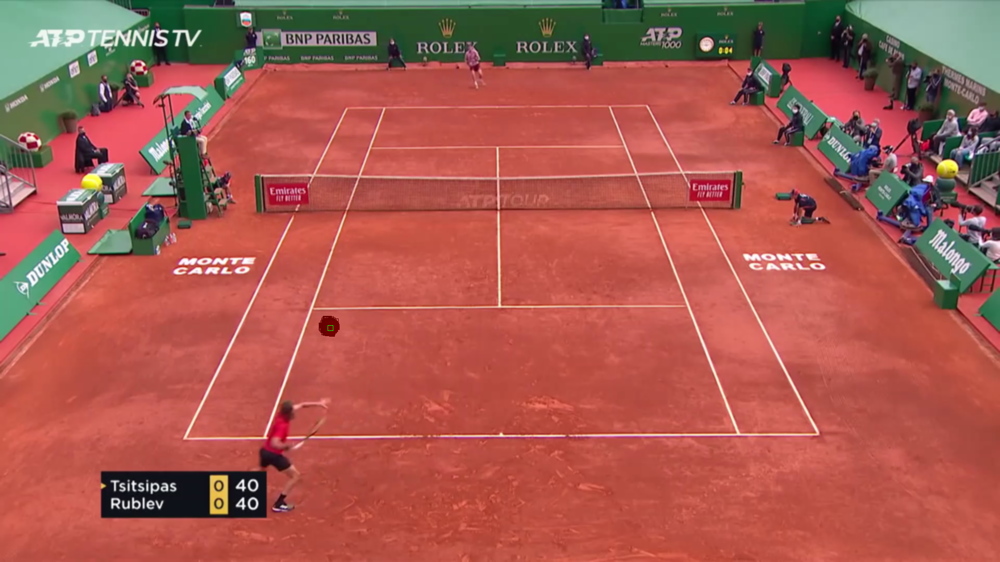

Frame: 11


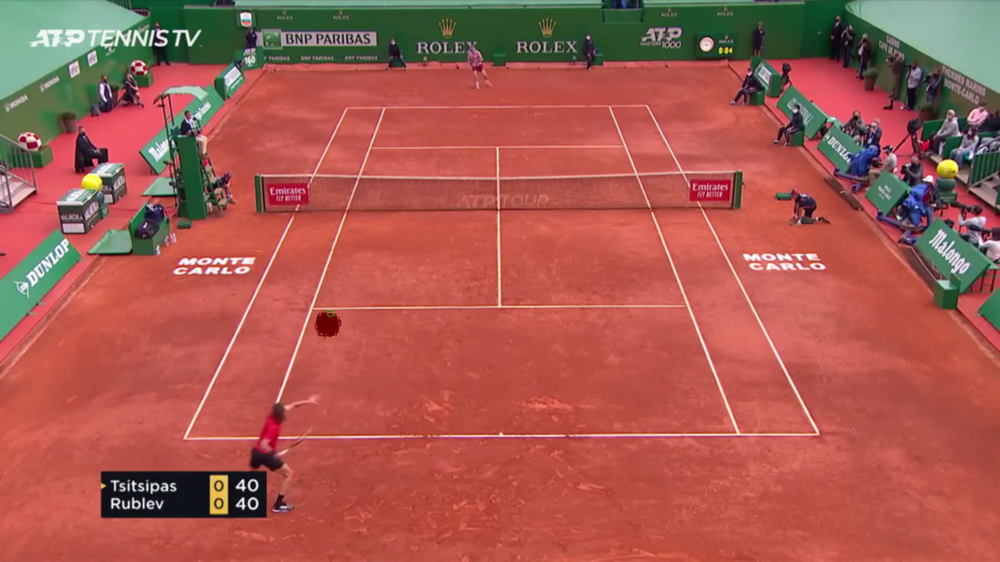

Frame: 12


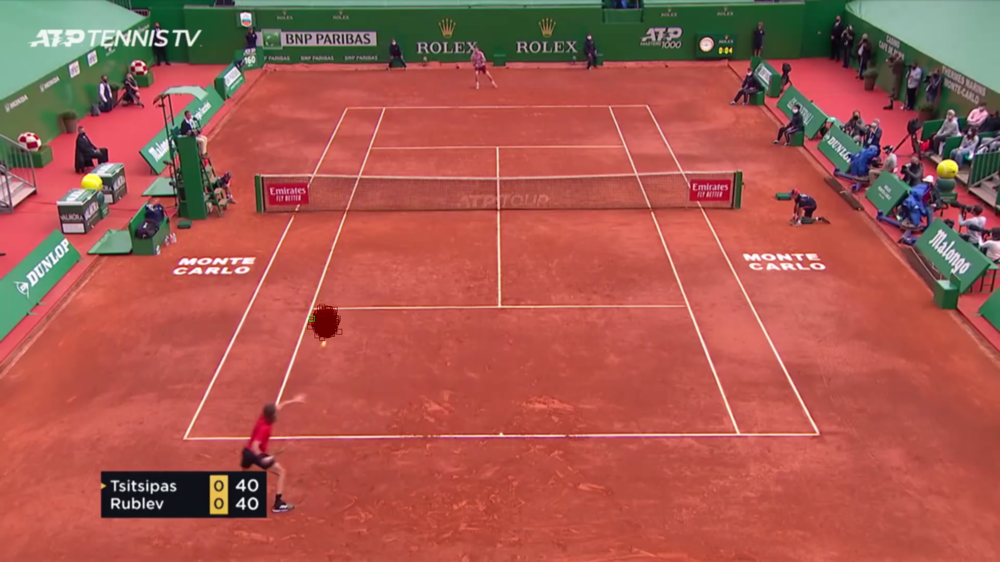

Frame: 13


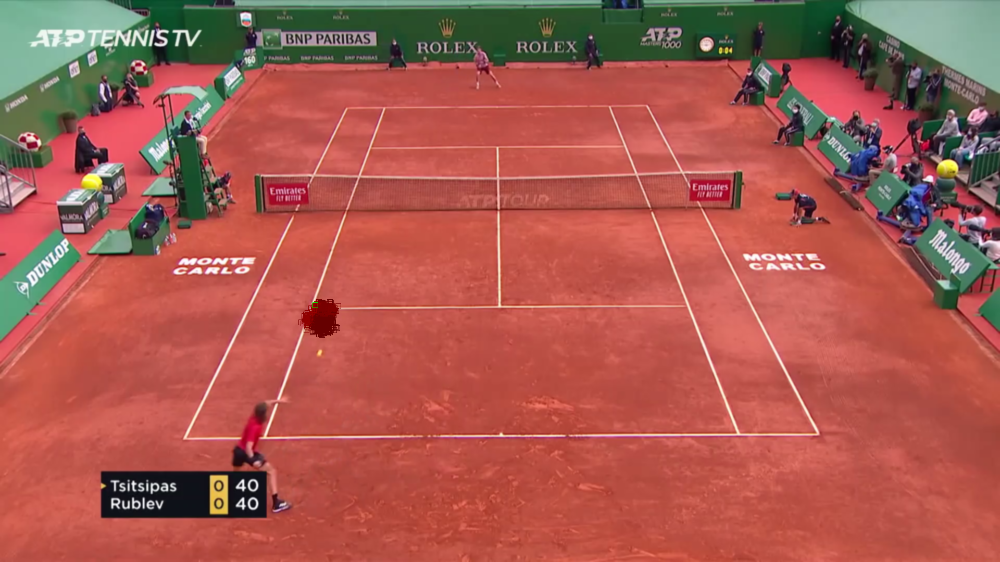

Frame: 14


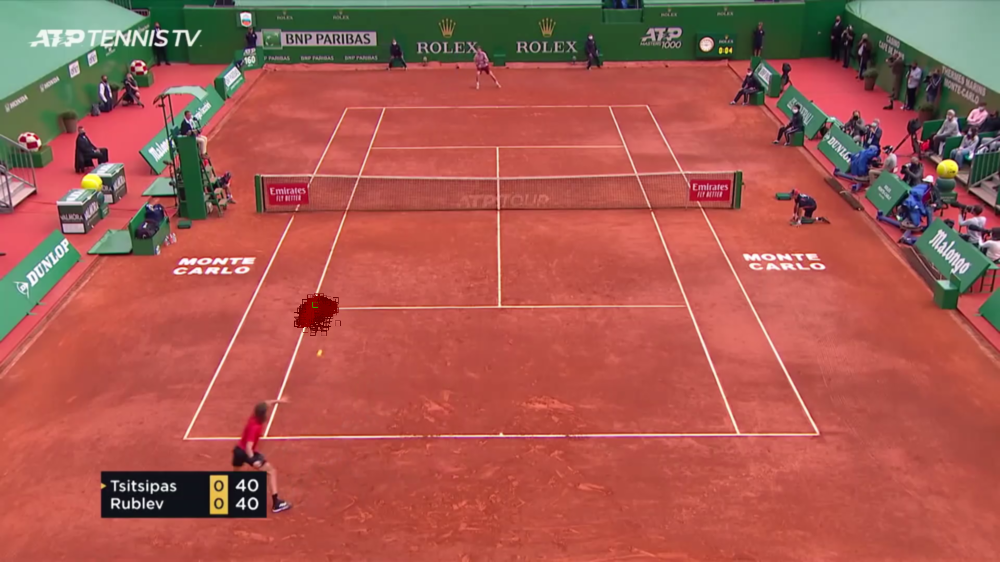

Frame: 15
Frame: 16
Frame: 17
Frame: 18
Frame: 19
Frame: 20
Frame: 21
Frame: 22
Frame: 23
Frame: 24
Frame: 25
Frame: 26
Frame: 27
Frame: 28
Frame: 29
Frame: 30
Frame: 31
Frame: 32
Frame: 33
Frame: 34
Frame: 35
Frame: 36
Frame: 37
Frame: 38
Frame: 39
Frame: 40
Frame: 41
Frame: 42
Frame: 43
Frame: 44
Frame: 45
Frame: 46
Frame: 47
Frame: 48
Frame: 49
Frame: 50
Frame: 51
Frame: 52
Frame: 53
Frame: 54
Frame: 55
Frame: 56
Frame: 57
Frame: 58
Frame: 59
Frame: 60
Frame: 61
Frame: 62
Frame: 63
Frame: 64
Frame: 65
Frame: 66
Frame: 67
Frame: 68
Frame: 69
Frame: 70
Frame: 71
Frame: 72
Frame: 73
Frame: 74
Frame: 75
Frame: 76
Frame: 77
Frame: 78
Frame: 79
Frame: 80
Frame: 81
Frame: 82
Frame: 83
Frame: 84
Frame: 85
Frame: 86
Frame: 87
Frame: 88
Frame: 89
Frame: 90
Frame: 91
Frame: 92
Frame: 93
Frame: 94
Frame: 95
Frame: 96
Frame: 97
Frame: 98
Frame: 99
Frame: 100
Frame: 101
Frame: 102
Frame: 103
Frame: 104
Frame: 105
Frame: 106
Frame: 107
Frame: 108
Frame: 109
Frame: 110
Frame: 111
Frame: 112
Frame: 

In [4]:
import numpy as np
import cv2
import os
from time import sleep
from google.colab.patches import cv2_imshow
filename  = 'video_input8.mp4'
cap = cv2.VideoCapture(filename) # fichero a procesar

# numero de particulas del Filtro de Particulas
# INI_MODIFICABLE
numParticles = 500
# FIN_MODIFICABLE
ParticleFilter.create(numParticles)

# Inicializamos las particulas en (100, 100)
# se podría realizar de forma aleatoria

# may be initialize it to the location of the ball in the first frame
for p in ParticleFilter.particles:
    p.x = 637#539#ball:  # np.random.uniform(0, 200)
    p.y = 632#833#ball:  # np.random.uniform(0, 200)

index = 0
ret, frame = cap.read()

# creamos el video de salida
height, width, layers = frame.shape
size = (width, height)
out = cv2.VideoWriter('result_' + filename, cv2.VideoWriter_fourcc(*'DIVX'), 15, size)

# mientras se haya podido leer el siguiente frame
while(ret):
    index = index + 1
    if index<9:
       ret, frame = cap.read()
       continue
    #cv2_imshow(frame)
    #break
    print("Frame: " + str(index))
    frame = cv2.GaussianBlur(frame, ksize=(5, 5), sigmaX=0)
    # medimos las particulas
    ParticleFilter.measure(frame)

    # dibujamos todas las particulas y la mejor
    for p in ParticleFilter.particles:
        p.draw(frame, (0,0, 100 + 155*p.weight))
    ParticleFilter.bestParticle.draw(frame, (0, 255, 0))
    out.write(frame)

    if index<15:
      cv2_imshow(frame)

    # preparamos para el siguiente frame, remuestrear y simular
    ParticleFilter.resample()
    ParticleFilter.simulate()

    # leer siguiente frame
    ret, frame = cap.read()

out.release()

cap.release()
cv2.destroyAllWindows()
